In [157]:
import pandas as pd
import altair as alt
import geopandas as gpd
import geoplot.crs as gcrs

In [158]:
windTurbine = pd.read_csv("data/opendata_wka_ib_gv_vb_sh_k_20231011.csv", sep=";")

# Data Cleaning and preperation

In [159]:
# data cleanup
# convertig the NABENHOEHE, ROTORDURCHMESSER from string to float and replace the ',' with '.'
windTurbine["NABENHOEHE"] = windTurbine["NABENHOEHE"].str.replace(",", ".").astype(float)
windTurbine["ROTORDURCHMESSER"] = windTurbine["ROTORDURCHMESSER"].str.replace(",", ".").astype(float)

In [160]:
# transform inbetriebnahme to datetime dd.mm.yyyy
windTurbine["GENEHMIGT_AM"] = pd.to_datetime(windTurbine["GENEHMIGT_AM"], format="%d.%m.%Y")
windTurbine["INBETRIEBNAHME"] = pd.to_datetime(windTurbine["INBETRIEBNAHME"], format="%d.%m.%Y")
windTurbine["DATENDATUM"] = pd.to_datetime(windTurbine["DATENDATUM"], format="%d.%m.%Y")

In [161]:
import pandas as pd
import numpy as np
import re

def convert_to_float(value):
    if pd.isnull(value):
        return np.nan
    match = re.search(r'\d+,\d+', value)
    if match:
        return float(match.group().replace(',', '.'))
    return np.nan

# Apply the function to your column
windTurbine['SCHALLLEISTUNGSPEGELConverted'] = windTurbine['SCHALLLEISTUNGSPEGEL'].apply(convert_to_float)


In [162]:
# the wind turbine with Inbetriebnhame on 1996-04-01 looks kinda sus since its is the type Tacke TW 600 
# but it shows that it produces 6000kw wich is alot for that date
# my resarch found out that the tacke tw 600 only has 600kw so we are going to correct it

#print(windTurbine[windTurbine["INBETRIEBNAHME"] == "1996-04-01"].head())

#correct the LEISTUNG to 600 for Entry 2900
windTurbine.loc[2900, "LEISTUNG"] = 600

In [163]:
# since there are 33 wind turbines with an older inbetriebnahme date than 1910 we are going to create a new
# dataframe for date analysis that does not consider these turbines
windTurbineDate = windTurbine[windTurbine["INBETRIEBNAHME"] > "1960-01-01"]

# they are also 10 turbines with a GENEHMIGT_AM date older than 1910 but with an Inbetriebnahme younger than 1910
# we are going to drop these turbines
windTurbineDate = windTurbineDate[windTurbineDate["GENEHMIGT_AM"] > "1960-01-01"]

In [164]:
# converting the used coordinates into lat/lon using pyproj
import pyproj

def convert_coordinates(df, easting_col, northing_col):
    # Define the projections
    utm_proj = pyproj.Proj(proj='utm', zone=32, ellps='WGS84')  # UTM coordinates (assuming zone 32)
    latlong_proj = pyproj.Proj(proj='latlong', datum='WGS84')  # LatLon with WGS84 datum used by GPS units and Google Earth

    # Apply the conversion to each row in the dataframe
    df['Longitude'], df['Latitude'] = pyproj.transform(utm_proj, latlong_proj, df[easting_col].values, df[northing_col].values)

    return df

# Convert the coordinates
windTurbine = convert_coordinates(windTurbine, 'OSTWERT', 'NORDWERT')



/tmp/ipykernel_730/2364807012.py:10: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  df['Longitude'], df['Latitude'] = pyproj.transform(utm_proj, latlong_proj, df[easting_col].values, df[northing_col].values)


In [165]:
# Load the geojson data into a geopandas dataframe
gdf = gpd.GeoDataFrame.from_file("data/gemeinden_simplify20.geojson")

# Count the number of wind turbines per gemeinde
turbine_counts = windTurbine['GEMEINDE'].value_counts().reset_index()
turbine_counts.columns = ['GEN', 'count']

# Merge the turbine counts with the geopandas dataframe
merged = gdf.set_index('GEN').join(turbine_counts.set_index('GEN'))

# Fill NA/NaN values with 0 (instead of dropping them)
merged['count'] = merged['count'].fillna(0)

In [166]:
# Calculate the difference in days between 'INBETRIEBNAHME' and 'GENEHMIGT_AM'
windTurbineDate['Time_Difference'] = (windTurbineDate['INBETRIEBNAHME'] - windTurbineDate['GENEHMIGT_AM']).dt.days

# Create a new column for the year
windTurbineDate['Year'] = windTurbineDate['GENEHMIGT_AM'].dt.year

# Visualization

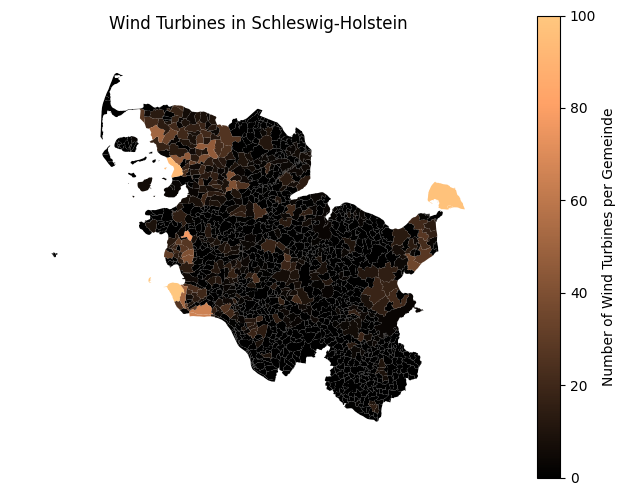

In [203]:
import geoplot as gplt
import matplotlib.pyplot as plt

# Plot the data using geoplot
ax = gplt.choropleth(
    merged, hue='count', projection=gcrs.WebMercator(), 
    linewidth=0.5,
    cmap="copper",
    legend=True, legend_kwargs={'label': "Number of Wind Turbines per Gemeinde"}
)

plt.title("Wind Turbines in Schleswig-Holstein")
plt.show()


In [168]:
chart = alt.Chart(windTurbine).mark_circle(aspect=True).encode(
    x='NABENHOEHE',
    y='LEISTUNG',
    size='ROTORDURCHMESSER',
    color='ROTORDURCHMESSER',
    tooltip=['NABENHOEHE', 'ROTORDURCHMESSER', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

chart


alt.Chart(...)

In [183]:
# Create the boxplot
boxplot = alt.Chart(windTurbineDate).mark_boxplot().encode(
    x='Year:O',
    y=alt.Y('Time_Difference:Q', title='Time Difference (in days)'),
    tooltip=['Time_Difference']
)

# Create the mean point plot
mean = alt.Chart(windTurbineDate).mark_point(color='red', filled=True).encode(
    x='Year:O',
    y='mean(Time_Difference):Q'
)

# Combine the plots
chart = boxplot + mean

chart.properties(
    title='Boxplot of Time Difference from Approval to First Energy Produced Over the Years'
)


alt.LayerChart(...)

there are 32 wind turbines where that have been taken into betriebnahme before the were genehmigt

In [169]:
# create a boxplot by windTurbine["HERSTELLER"] and the mean Leistung, sort by mean Leistung

chart = alt.Chart(windTurbine).mark_boxplot().encode(
    x=alt.X('HERSTELLER', sort='x'),
    y='NABENHOEHE',
).properties(
    width=400 ,
    height=400
).interactive()

chart

alt.Chart(...)

<Axes: ylabel='count'>

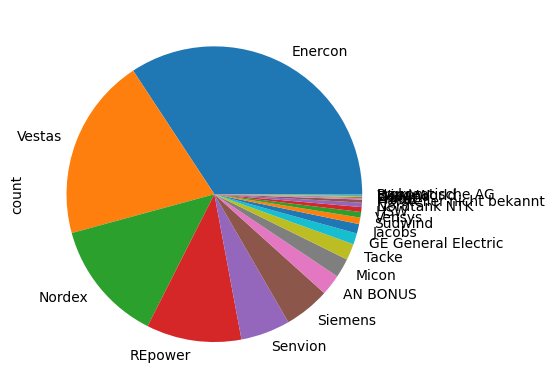

In [170]:
# print distrubition of the wind turbine manufacturers
windTurbine["HERSTELLER"].value_counts().plot(kind="pie")

In [171]:
# plot INBETRIEBNAHME and LEISTUNG with altair
import altair as alt


alt.Chart(windTurbineDate).mark_circle().encode(
    x='INBETRIEBNAHME',
    y='LEISTUNG',
    tooltip=['INBETRIEBNAHME', 'LEISTUNG']
).properties(
    width=400 ,
    height=400
).interactive()

alt.Chart(...)

In [191]:
import rasterio
import geopandas as gpd

# Read the tif file and store it in a variable
raster = rasterio.open("data/schleswig_holstein_wind-speed_100m.tif")

# Get the CRS of the raster as a CRS object
raster_crs = raster.crs

# Convert the CRS object to an EPSG code
raster_epsg = raster_crs.to_epsg()

# Set the CRS of your geopandas dataframe to match the EPSG code
gdf = gpd.GeoDataFrame.from_file("data/gemeinden_simplify20.geojson").set_crs(epsg=raster_epsg)


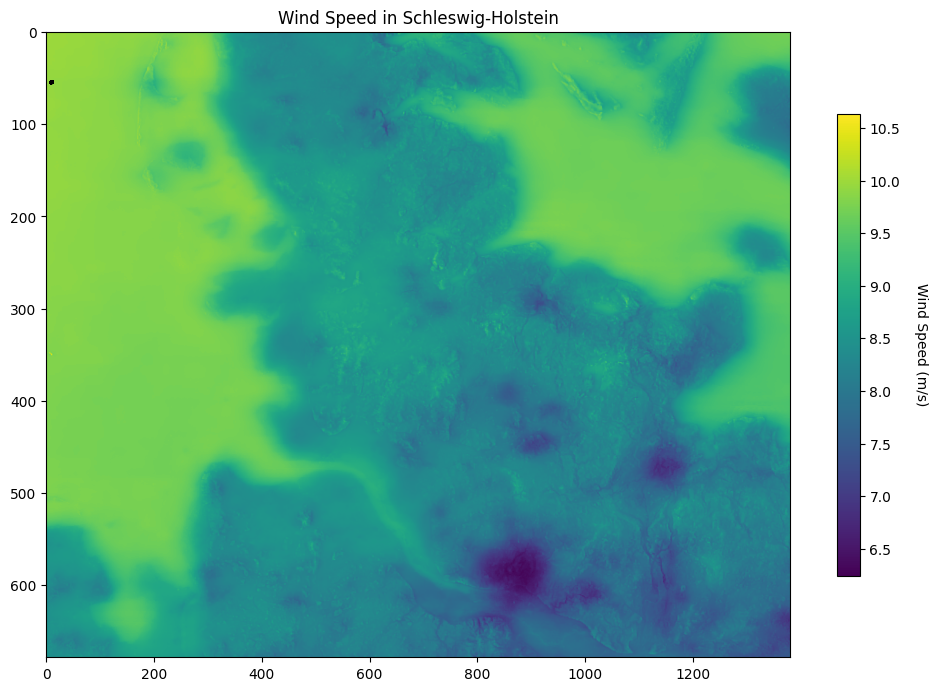

In [225]:
import rasterio.plot as rplt
import matplotlib.pyplot as plt

# Read the first band of the raster data
wind_speed_data = raster.read(1)

fig, ax = plt.subplots(1, figsize=(12, 12))

# Plot the raster data
im = ax.imshow(wind_speed_data, cmap='viridis')

# Overlay the GeoDataFrame
gdf.boundary.plot(ax=ax, color=None, edgecolor='k', linewidth = 2)

# Add a colorbar to the plot
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.5)
cbar.ax.set_ylabel('Wind Speed (m/s)', rotation=270, labelpad=20)

plt.title("Wind Speed in Schleswig-Holstein")
plt.show()

import rasterio
import geopandas as gpd

# Read the tif file and store it in a variable
raster = rasterio.open("data/schleswig_holstein_wind-speed_100m.tif")

# Get the CRS of the raster as a CRS object
raster_crs = raster.crs

# Convert the CRS object to an EPSG code
raster_epsg = raster_crs.to_epsg()

# Set the CRS of your geopandas dataframe to match the EPSG code
gdf = gpd.GeoDataFrame.from_file("data/gemeinden_simplify20.geojson").set_crs(epsg=raster_epsg)
